*Инсталляция необходимых библиотек и моделей*

In [0]:
%tensorflow_version 2.x

In [2]:
!pip install pycocotools


In [3]:
!pip install tf_slim

     |████████████████████████████████| 358kB 2.8MB/s 


In [4]:
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2649, done.
remote: Counting objects: 100% (2649/2649), done.
remote: Compressing objects: 100% (2311/2311), done.
remote: Total 2649 (delta 528), reused 1339 (delta 304), pack-reused 0
Receiving objects: 100% (2649/2649), 32.15 MiB | 13.67 MiB/s, done.
Resolving deltas: 100% (528/528), done.


In [5]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

object_detection/protos/input_reader.proto: warning: Import object_detection/protos/image_resizer.proto but not used.


In [6]:
%%bash 
cd models/research/
pip install . 

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1113489 sha256=6e38ff309bb15abf05943081156d93b39af7e3105cdc4db1fd180a7ae17ba240
  Stored in directory: /tmp/pip-ephem-wheel-cache-w1obvesn/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
Successfully built object-detection


In [0]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

In [0]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

Подготовка модели

In [0]:
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))
  model = model.signatures['serving_default']

  return model

In [0]:
PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [20]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('images/Moscow_traffic_congestion.jpg'),
 PosixPath('images/cat-color.jpg'),
 PosixPath('images/football.jpg'),
 PosixPath('images/traffic-people-streets.jpg')]

In [19]:
model_name = 'ssd_mobilenet_v1_coco_2017_11_17'
detection_model = load_model(model_name)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [13]:
print(detection_model.inputs)
detection_model.output_dtypes

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


{'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'detection_scores': tf.float32,
 'num_detections': tf.float32}

In [0]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  
  input_tensor = tf.convert_to_tensor(image)
  
  input_tensor = input_tensor[tf.newaxis,...]

  
  output_dict = model(input_tensor)

  
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  
  if 'detection_masks' in output_dict:
    
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [0]:
def show_inference(model, image_path):
  
  image_np = np.array(Image.open(image_path))
  
  output_dict = run_inference_for_single_image(model, image_np)
  
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

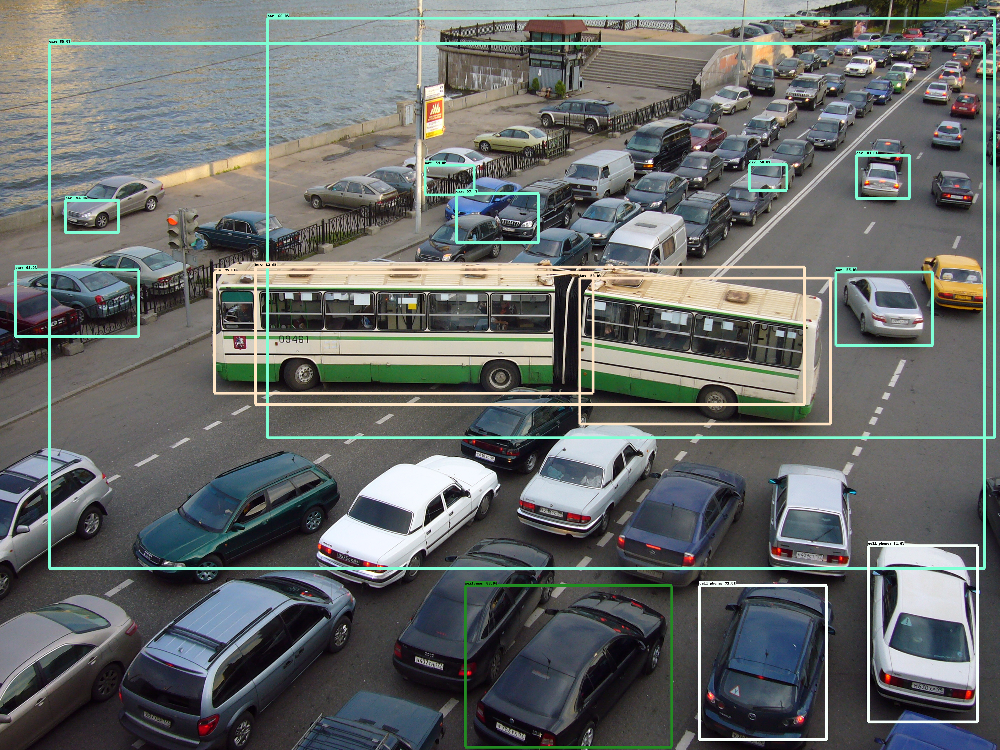

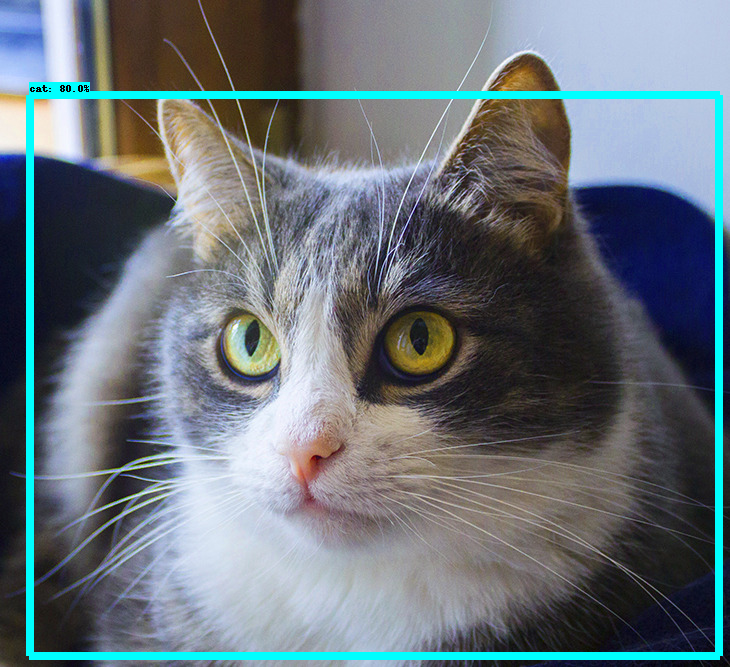

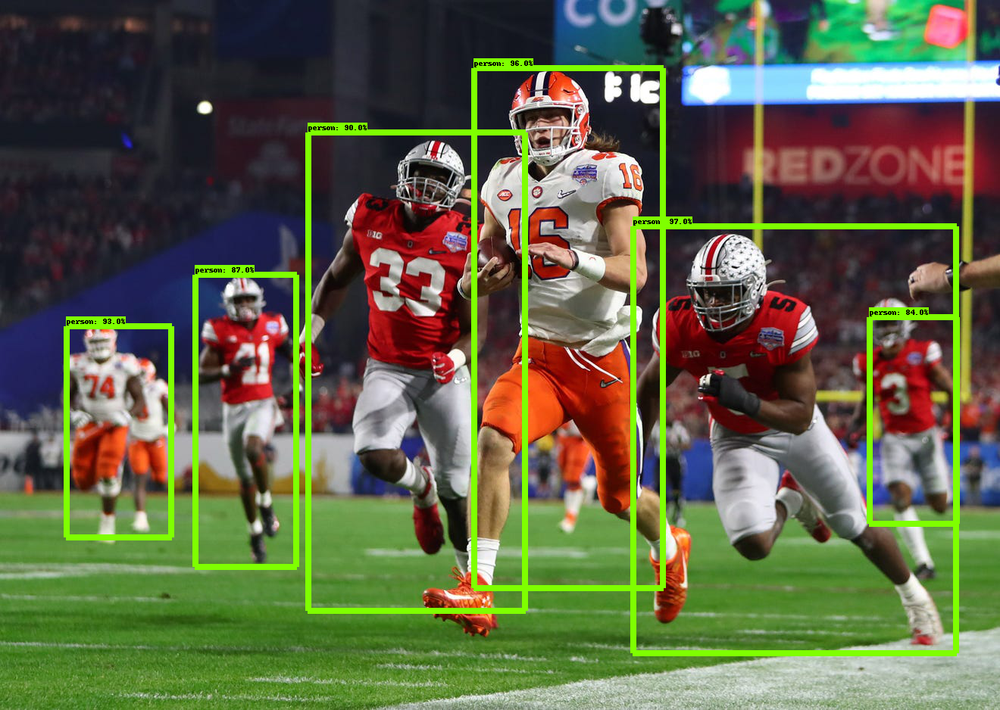

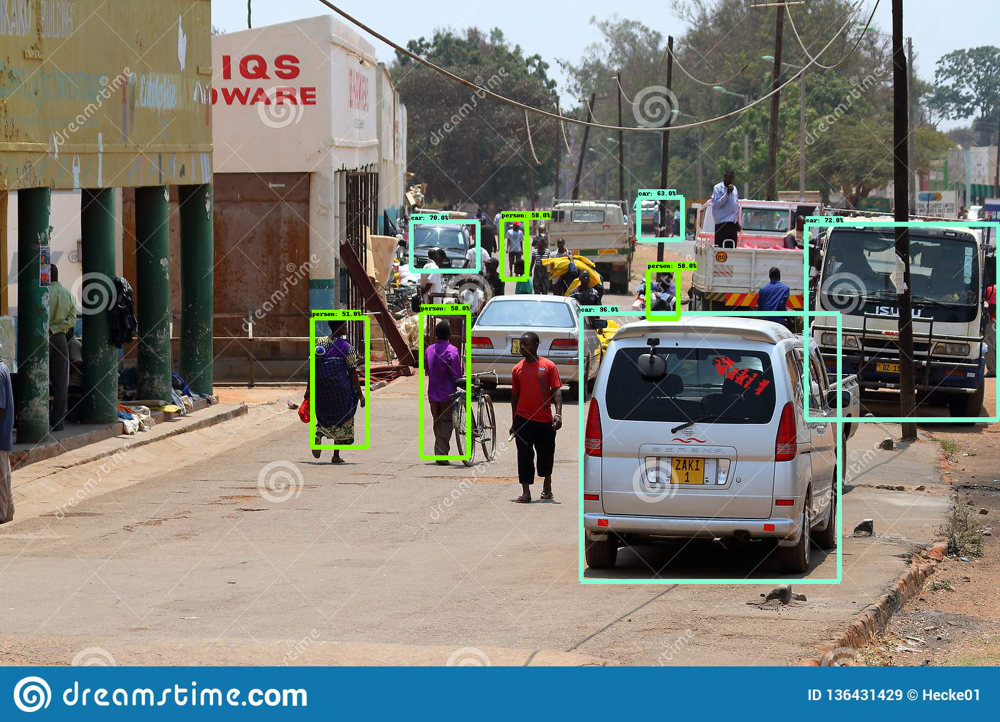

In [21]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path)